# Visium analysis

In [1]:
import seaborn as sns

import sys
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
#import cell2location
import os

import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                 9.4.0
asciitree           NA
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cloudpickle         2.2.1
cycler              0.10.0
cython_runtime      NA
dask                2023.3.1
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
entrypoints         0.4
executing           1.2.0
fasteners           0.18
h5py                3.8.0
hypergeom_ufunc     NA
igraph              0.10.4
importlib_resources NA
ipykernel           6.14.0
ipywidgets          8.0.6
jedi                0.18.2
jinja2              3.1.2
joblib              1.2.0
kiwisolver          1.4.4
leidenalg           0.9.1
llvmlite            0.38.1
markupsafe          2.1.2
matplotlib          3.7.1
mpl_toolkits        NA
msgpack             1.0.5
natsort             8.3.1
nbinom_ufunc        NA
ncf_ufunc           NA
numba               0.55.2
numcodecs           0.11.0
numpy        

In [3]:
sp_data_folder="/nfs/team205/rb29/mice_gutTCRtg_project/data/visium/"

In [4]:
meta = pd.read_csv(sp_data_folder+'Meta_mouse_gut_spatial.csv', index_col = 0)

In [5]:
meta.head()

,Sanger_ID,Sample_name,Slide_ID,Slide,Capture_area,Mouse,Conditions
Sample,,,,,,,
1A_Hh.only,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only
1B_Hh.anti_IL10r,Mus_Tcel13255054,1B_Hh.anti_IL10r,V12Y31-030_B1,V12Y31-030,B1,1B,Hh_anti-Il10r
2A_Hh.only,Mus_Tcel13255055,2A_Hh.only,V12Y31-030_C1,V12Y31-030,C1,2A,Hh_only
2B_Hh.anti_IL10r,Mus_Tcel13255056,2B_Hh.anti_IL10r,V12Y31 - 030_D1,V12Y31-030,D1,2B,Hh_anti-Il10r
3A_Hh.only,Mus_Tcel13290868,3A_Hh.only,V12U21-349-A1,V12U21-349,A1,3A,Hh_only


In [6]:
meta['Sanger_ID']

Sample
1A_Hh.only          Mus_Tcel13255053
1B_Hh.anti_IL10r    Mus_Tcel13255054
2A_Hh.only          Mus_Tcel13255055
2B_Hh.anti_IL10r    Mus_Tcel13255056
3A_Hh.only          Mus_Tcel13290868
3B_Hh.anti_IL10r    Mus_Tcel13290869
4A_Hh.only          Mus_Tcel13290870
4B_Hh.anti_IL10r    Mus_Tcel13290871
Name: Sanger_ID, dtype: object

In [7]:
# Using the "spatial" folder from imagespot_preprocessing (Visiumator)

In [7]:
## Load data:

In [8]:
def read_and_qc(sample_name, path=sp_data_folder):
    r""" This function reads the data for one 10X spatial experiment into the anndata object.
    It also calculates QC metrics. Modify this function if required by your workflow.
    
    :param sample_name: Name of the sample
    :param path: path to data
    """
    
    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']

    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'
    
    file = list(adata.uns['spatial'].keys())[0]
    adata.uns['spatial'][sample_name] = adata.uns['spatial'][file].copy()
    del adata.uns['spatial'][file]
    print(adata.uns['spatial'].keys())
    
    return adata

In [9]:
def select_slide(adata, s, s_col='Sanger_ID'):
    r""" This function selects the data for one slide from the spatial anndata object.
    
    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """
    
    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}
    
    return slide

## Read spatial data for all the slides in a loop:

In [10]:
# Read the data into anndata objects

slides = []
for i in meta['Sanger_ID']:
    slides.append(read_and_qc(i, path=sp_data_folder))


# Combine anndata objects together
adata = slides[0].concatenate(
    slides[1:],
    batch_key="sample",
    uns_merge="unique",
    batch_categories=meta['Sample_name'],
    index_unique=None)

adata.var_names_make_unique()

meta.index = meta['Sample_name']
for c in meta.columns:
    meta.loc[:, c] = meta[c].astype(str)
adata.obs[meta.columns] = meta.reindex(index=adata.obs['sample']).values

reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13255053/filtered_feature_bc_matrix.h5
 (0:00:00)
dict_keys(['Mus_Tcel13255053'])
reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13255054/filtered_feature_bc_matrix.h5
 (0:00:00)
dict_keys(['Mus_Tcel13255054'])
reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13255055/filtered_feature_bc_matrix.h5
 (0:00:01)
dict_keys(['Mus_Tcel13255055'])
reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13255056/filtered_feature_bc_matrix.h5
 (0:00:00)
dict_keys(['Mus_Tcel13255056'])
reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13290868/filtered_feature_bc_matrix.h5
 (0:00:00)
dict_keys(['Mus_Tcel13290868'])
reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13290869/filtered_feature_bc_matrix.h5
 (0:00:01)
dict_keys(['Mus_Tcel13290869'])
reading /nfs/team205/rb29/mice_gutTCRtg_project/data/visium/Mus_Tcel13290870/filtered_feature_bc_mat

In [11]:
adata

AnnData object with n_obs × n_vars = 29287 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'Sanger_ID', 'Sample_name', 'Slide_ID', 'Slide', 'Capture_area', 'Mouse', 'Conditions'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-1A_Hh.only', 'mean_counts-1A_Hh.only', 'log1p_mean_counts-1A_Hh.only', 'pct_dropout_by_counts-1A_Hh.only', 'total_counts-1A_Hh.only', 'log1p_total_counts-1A_Hh.only', 'n_cells_by_counts-1B_Hh.anti_IL10r', 'mean_counts-1B_Hh.anti_IL10r', 'log1p_mean_counts-1B_Hh.anti_IL10r', 'pct_dropout_by_counts-1B_Hh.anti_IL10r', 'total_counts-1B_Hh.anti_IL10r', 'log1p_total_counts-1B_Hh.anti_IL10r', 'n_cells_by_counts-2A_Hh.only', 'mean_counts-2A_Hh.only', 'log1p_mean_counts-2A_Hh.only', 'pct_dropout_by_counts-2A_Hh.only'

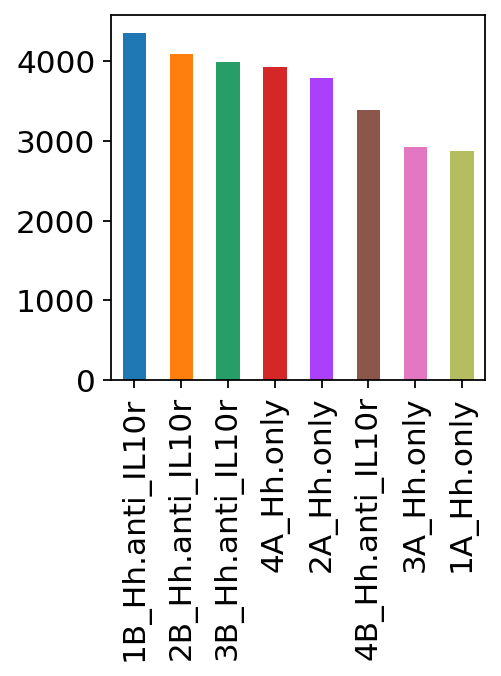

In [12]:
with mpl.rc_context({'font.size': 8, 'figure.figsize': (5, 5)}):
    adata.obs['Sample_name'].value_counts().plot(kind='bar',
        color=['#1f77b4','#ff7f0e','#279e68','#d62728','#aa40fc','#8c564b','#e377c2','#b5bd61'],figsize=(3,3),width=0.5, grid=False)
    plt.savefig("Spots_raw.pdf")
    plt.show()

In [13]:
adata.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,Sanger_ID,Sample_name,Slide_ID,Slide,Capture_area,Mouse,Conditions
spot_id,,,,,,,,,,,,,,,,,,,,
Mus_Tcel13255053_AAACAAGTATCTCCCA-1,1.0,50.0,102.0,1A_Hh.only,8180,9.009570,40689.0,10.613738,15.439062,23.721399,34.336061,47.742633,0.011797,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only
Mus_Tcel13255053_AAACAATCTACTAGCA-1,1.0,3.0,43.0,1A_Hh.only,78,4.369448,83.0,4.430817,66.265060,100.000000,100.000000,100.000000,0.048193,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only
Mus_Tcel13255053_AAACAGAGCGACTCCT-1,1.0,14.0,94.0,1A_Hh.only,175,5.170484,203.0,5.318120,38.423645,63.054187,100.000000,100.000000,0.044335,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only
Mus_Tcel13255053_AAACATTTCCCGGATT-1,1.0,61.0,97.0,1A_Hh.only,6584,8.792550,41999.0,10.645425,26.150623,33.836520,43.096264,57.165647,0.030953,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only
Mus_Tcel13255053_AAACCCGAACGAAATC-1,1.0,45.0,115.0,1A_Hh.only,8862,9.089641,97637.0,11.489022,24.969018,32.589080,41.907269,56.314717,0.034516,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mus_Tcel13290871_TTGTTGTGTGTCAAGA-1,1.0,31.0,77.0,4B_Hh.anti_IL10r,3887,8.265650,13262.0,9.492734,27.650430,37.121098,48.755844,62.871362,0.027899,Mus_Tcel13290871,4B_Hh.anti_IL10r,V12U21-349-D1,V12U21-349,D1,4B,Hh_anti-Il10r
Mus_Tcel13290871_TTGTTTCACATCCAGG-1,1.0,58.0,42.0,4B_Hh.anti_IL10r,3621,8.194782,11161.0,9.320271,23.187886,34.127766,45.847146,60.406774,0.010752,Mus_Tcel13290871,4B_Hh.anti_IL10r,V12U21-349-D1,V12U21-349,D1,4B,Hh_anti-Il10r
Mus_Tcel13290871_TTGTTTCATTAGTCTA-1,1.0,60.0,30.0,4B_Hh.anti_IL10r,2372,7.771910,5706.0,8.649448,24.640729,34.840519,46.074308,61.987382,0.028216,Mus_Tcel13290871,4B_Hh.anti_IL10r,V12U21-349-D1,V12U21-349,D1,4B,Hh_anti-Il10r


In [14]:
adata.obs.rename({'Sample_name':'library_id'}, axis=1, inplace=True)

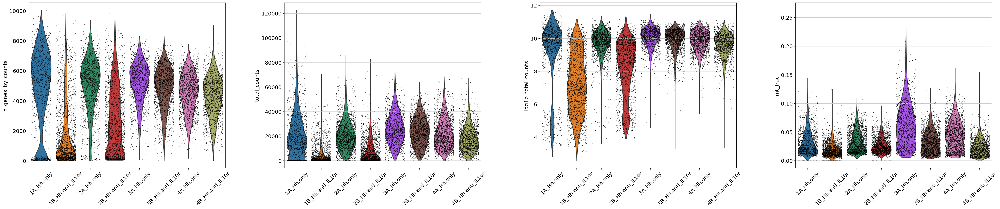

In [15]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'log1p_total_counts','mt_frac'],
             jitter=0.4, groupby = 'sample', rotation= 45)

In [19]:
adata.obs['in_tissue'].value_counts()

1.0    25276
0.0     4011
Name: in_tissue, dtype: int64

In [20]:
## Remove spots that are not in the tissue
adata = adata[adata.obs['in_tissue'] == 1.0]

In [26]:
# need to plot the two sections separately and specify the library_id
sample_names = list(adata.obs['Sanger_ID'].unique())

for s in sample_names:
    sc.pl.spatial(adata[adata.obs.Sanger_ID == s,:], library_id=s, 
                  color = ["total_counts", "n_genes_by_counts", 'mt_frac'], save=s+".pdf", show=False)


## QC and preprocessing

In [25]:
# PLOT QC FOR EACH SAMPLE 
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i, s in enumerate(adata.obs['Sanger_ID'].unique()):
    #fig.suptitle('Covariates for filtering')
    
    slide = select_slide(adata, s)
    sns.distplot(slide.obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel(f'total_counts | {s}')
    
    sns.distplot(slide.obs['total_counts']\
                 [slide.obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel(f'total_counts | {s}')
    
    sns.distplot(slide.obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel(f'n_genes_by_counts | {s}')
    
    sns.distplot(slide.obs['n_genes_by_counts']\
                 [slide.obs['n_genes_by_counts']<5000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel(f'n_genes_by_counts | {s}')
    
#plt.tight_layout()
mpl.use("Agg")  # Prevent showing stuff
plt.savefig('/nfs/team205/rb29/mice_gutTCRtg_project/Src/Mice-gut.TCRtg/new_analysis/submission/scRNAseq_NicheSeq/figures/QC_visium.pdf', format='pdf')

In [24]:
adata.raw = adata

Note! Mitochondia-encoded genes (gene names start with prefix mt- or MT-) are irrelevant for spatial mapping because their expression represents technical artifacts in the single cell and nucleus data rather than biological abundance of mitochondria. Yet these genes compose 15-40% of mRNA in each location. Hence, to avoid mapping artifacts we strongly recommend removing mitochondrial genes.

In [25]:
# mitochondria-encoded (MT) genes should be removed for spatial mapping
adata.obsm['mt'] = adata[:, adata.var['mt'].values].X.toarray()
adata = adata[:, ~adata.var['mt'].values]

In [26]:
adata

View of AnnData object with n_obs × n_vars = 25276 × 32272
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'Sanger_ID', 'library_id', 'Slide_ID', 'Slide', 'Capture_area', 'Mouse', 'Conditions'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-1A_Hh.only', 'mean_counts-1A_Hh.only', 'log1p_mean_counts-1A_Hh.only', 'pct_dropout_by_counts-1A_Hh.only', 'total_counts-1A_Hh.only', 'log1p_total_counts-1A_Hh.only', 'n_cells_by_counts-1B_Hh.anti_IL10r', 'mean_counts-1B_Hh.anti_IL10r', 'log1p_mean_counts-1B_Hh.anti_IL10r', 'pct_dropout_by_counts-1B_Hh.anti_IL10r', 'total_counts-1B_Hh.anti_IL10r', 'log1p_total_counts-1B_Hh.anti_IL10r', 'n_cells_by_counts-2A_Hh.only', 'mean_counts-2A_Hh.only', 'log1p_mean_counts-2A_Hh.only', 'pct_dropout_by_counts-2A_H

In [27]:
#adata.write("/nfs/team205/rb29/mice_gutTCRtg_project/Src/Mice-gut.TCRtg/new_analysis/Visium/h5ad_files/mouseST_all_preQC_tissueDect.h5ad")

### Filter low QC spots:

In [28]:
sc.pp.filter_cells(adata, min_counts=500)
#sc.pp.filter_cells(adata, max_counts=50000)
adata = adata[adata.obs["mt_frac"] < 0.15]
print(f"#cells after MT filter: {adata.n_obs}")
#sc.pp.filter_genes(adata, min_cells=3)

filtered out 2415 cells that have less than 500 counts
#cells after MT filter: 22792


In [29]:
#adata.write('/nfs/team205/rb29/mice_gutTCRtg_project/Src/Mice-gut.TCRtg/new_analysis/Visium/h5ad_files/mouseST_all_tissueDect_QCed.h5ad')

In [9]:
#adata.write('/lustre/scratch126/cellgen/team205/rb29/mice-gut.TCRtg/mouseST_C2L/data/mouseST_all_tissueDect_QCed.h5ad')

In [30]:
#### Free up memory:
import gc 
gc.collect()

101805

In [31]:
#### Clear cache
import ctypes
libc = ctypes.CDLL("libc.so.6") # clearing cache 
libc.malloc_trim(0)

1

In [ ]:
####

In [32]:
adata_vis_plt = adata.copy()

# Log-transform (log(data + 1))
sc.pp.log1p(adata_vis_plt)

# Find highly variable genes within each sample
adata_vis_plt.var['highly_variable'] = False
for s in adata_vis_plt.obs['sample'].unique():
    
    adata_vis_plt_1 = adata_vis_plt[adata_vis_plt.obs['sample'].isin([s]), :]
    sc.pp.highly_variable_genes(adata_vis_plt_1, min_mean=0.0125, max_mean=5, min_disp=0.5, n_top_genes=1000)
    
    hvg_list = list(adata_vis_plt_1.var_names[adata_vis_plt_1.var['highly_variable']])
    
    #print(f"Highly variable genes: {len(hvg_list)}")
    adata_vis_plt.var.loc[hvg_list, 'highly_variable'] = True
    

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00

In [34]:
# Scale the data ( (data - mean) / sd )
sc.pp.scale(adata_vis_plt, max_value=10)
# PCA, KNN construction, UMAP
sc.tl.pca(adata_vis_plt, svd_solver='arpack', n_comps=40, use_highly_variable=True)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=40
    finished (0:00:20)


In [35]:
sc.pp.neighbors(adata_vis_plt, n_neighbors = 20, n_pcs = 40, metric='cosine')
sc.tl.umap(adata_vis_plt, min_dist = 0.3, spread = 1)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


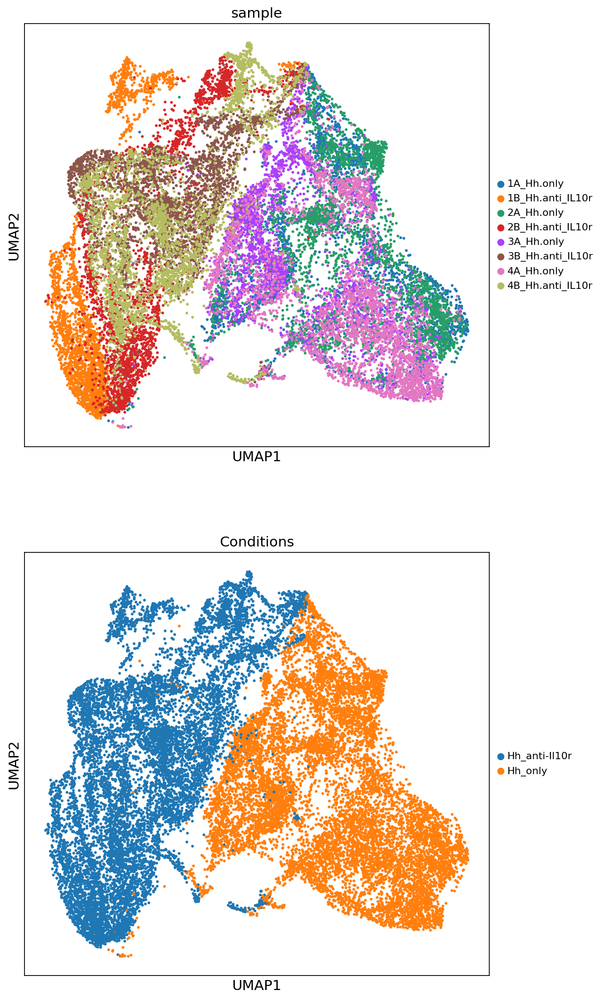

In [37]:
with mpl.rc_context({'figure.figsize': [8, 8],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata_vis_plt, color=['sample','Conditions'], size=30,
               color_map = 'RdPu', ncols = 1, #legend_loc='on data',
               legend_fontsize=10)

# Integration with Scanorama:

In [43]:
#adata = sc.read('/nfs/team205/rb29/mice_gutTCRtg_project/Src/Mice-gut.TCRtg/new_analysis/Visium/h5ad_files/mouseST_all_QCed.h5ad')

In [44]:
adata=adata_vis_plt.copy()

In [45]:
adata.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,mt_frac,Sanger_ID,library_id,Slide_ID,Slide,Capture_area,Mouse,Conditions,n_counts,clusters
spot_id,,,,,,,,,,,,,,,,,,,,,
Mus_Tcel13255053_AAACAAGTATCTCCCA-1,1.0,50.0,102.0,1A_Hh.only,8180,9.009570,40689.0,10.613738,15.439062,23.721399,...,0.011797,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only,40209.0,5
Mus_Tcel13255053_AAACATTTCCCGGATT-1,1.0,61.0,97.0,1A_Hh.only,6584,8.792550,41999.0,10.645425,26.150623,33.836520,...,0.030953,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only,40699.0,4
Mus_Tcel13255053_AAACCCGAACGAAATC-1,1.0,45.0,115.0,1A_Hh.only,8862,9.089641,97637.0,11.489022,24.969018,32.589080,...,0.034516,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only,94267.0,4
Mus_Tcel13255053_AAACCTCATGAAGTTG-1,1.0,37.0,19.0,1A_Hh.only,8490,9.046762,39282.0,10.578547,14.670842,21.218370,...,0.034851,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only,37913.0,16
Mus_Tcel13255053_AAACGAGACGGTTGAT-1,1.0,35.0,79.0,1A_Hh.only,4576,8.428799,12352.0,9.421655,17.810881,24.417098,...,0.016920,Mus_Tcel13255053,1A_Hh.only,V12Y31-030_A1,V12Y31-030,A1,1A,Hh_only,12143.0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mus_Tcel13290871_TTGTTGTGTGTCAAGA-1,1.0,31.0,77.0,4B_Hh.anti_IL10r,3887,8.265650,13262.0,9.492734,27.650430,37.121098,...,0.027899,Mus_Tcel13290871,4B_Hh.anti_IL10r,V12U21-349-D1,V12U21-349,D1,4B,Hh_anti-Il10r,12892.0,2
Mus_Tcel13290871_TTGTTTCACATCCAGG-1,1.0,58.0,42.0,4B_Hh.anti_IL10r,3621,8.194782,11161.0,9.320271,23.187886,34.127766,...,0.010752,Mus_Tcel13290871,4B_Hh.anti_IL10r,V12U21-349-D1,V12U21-349,D1,4B,Hh_anti-Il10r,11041.0,2
Mus_Tcel13290871_TTGTTTCATTAGTCTA-1,1.0,60.0,30.0,4B_Hh.anti_IL10r,2372,7.771910,5706.0,8.649448,24.640729,34.840519,...,0.028216,Mus_Tcel13290871,4B_Hh.anti_IL10r,V12U21-349-D1,V12U21-349,D1,4B,Hh_anti-Il10r,5545.0,1


In [46]:
library_names = list(adata.obs['library_id'].unique())

adatas = {}
for batch in library_names:
    adatas[batch] = adata[adata.obs['library_id'] == batch,]

adatas 

{'1A_Hh.only': View of AnnData object with n_obs × n_vars = 2191 × 32272
     obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'Sanger_ID', 'library_id', 'Slide_ID', 'Slide', 'Capture_area', 'Mouse', 'Conditions', 'n_counts', 'clusters'
     var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-1A_Hh.only', 'mean_counts-1A_Hh.only', 'log1p_mean_counts-1A_Hh.only', 'pct_dropout_by_counts-1A_Hh.only', 'total_counts-1A_Hh.only', 'log1p_total_counts-1A_Hh.only', 'n_cells_by_counts-1B_Hh.anti_IL10r', 'mean_counts-1B_Hh.anti_IL10r', 'log1p_mean_counts-1B_Hh.anti_IL10r', 'pct_dropout_by_counts-1B_Hh.anti_IL10r', 'total_counts-1B_Hh.anti_IL10r', 'log1p_total_counts-1B_Hh.anti_IL10r', 'n_cells_by_counts-2A_Hh.only', 'mean_counts-2A_Hh.only', 'log1p_mean_counts-

In [47]:
import scanorama

#convert to list of AnnData objects
adatas = list(adatas.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)


# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata.obsm["Scanorama"] = all_s

Found 32272 genes among all datasets
[[0.         0.03712208 0.90369694 0.08626198 0.09721588 0.01323597
  0.07485167 0.01323597]
 [0.         0.         0.0206659  0.54075775 0.00344432 0.04401072
  0.00382702 0.05089935]
 [0.         0.         0.         0.17038414 0.37263969 0.03717472
  0.24566295 0.02509294]
 [0.         0.         0.         0.         0.05609574 0.16903515
  0.01234106 0.31002244]
 [0.         0.         0.         0.         0.         0.49980732
  0.78967254 0.19614644]
 [0.         0.         0.         0.         0.         0.
  0.15273865 0.85101721]
 [0.         0.         0.         0.         0.         0.
  0.         0.2900641 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]]
Processing datasets (0, 2)
Processing datasets (5, 7)
Processing datasets (4, 6)
Processing datasets (1, 3)
Processing datasets (4, 5)
Processing datasets (2, 4)
Processing datasets (3, 7)
Processing datasets (6, 7)
Processing datasets (2, 6)

In [48]:
adata

AnnData object with n_obs × n_vars = 22792 × 32272
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'Sanger_ID', 'library_id', 'Slide_ID', 'Slide', 'Capture_area', 'Mouse', 'Conditions', 'n_counts', 'clusters'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-1A_Hh.only', 'mean_counts-1A_Hh.only', 'log1p_mean_counts-1A_Hh.only', 'pct_dropout_by_counts-1A_Hh.only', 'total_counts-1A_Hh.only', 'log1p_total_counts-1A_Hh.only', 'n_cells_by_counts-1B_Hh.anti_IL10r', 'mean_counts-1B_Hh.anti_IL10r', 'log1p_mean_counts-1B_Hh.anti_IL10r', 'pct_dropout_by_counts-1B_Hh.anti_IL10r', 'total_counts-1B_Hh.anti_IL10r', 'log1p_total_counts-1B_Hh.anti_IL10r', 'n_cells_by_counts-2A_Hh.only', 'mean_counts-2A_Hh.only', 'log1p_mean_counts-2A_Hh.only', 'pct_dropou

In [49]:
sc.pp.neighbors(adata, use_rep="Scanorama")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
running Leiden clustering
    finished: found 24 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:03)


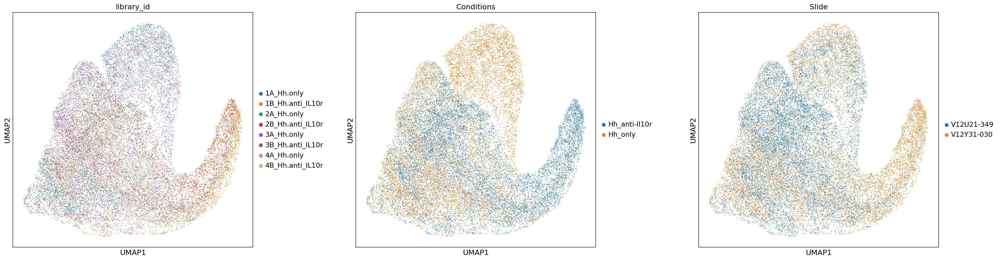

In [51]:
sc.pl.umap(adata, color=["library_id", "Conditions", "Slide"], wspace=0.3)

## SCVI integration:

In [ ]:
### GPU is needed for this part

In [56]:
import scvi
from collections import Counter

Global seed set to 0


In [2]:
#adata=sc.read("/nfs/team205/rb29/mice_gutTCRtg_project/Src/Mice-gut.TCRtg/new_analysis/h5ad_files/Reference_object_C2L_rawCounts_beforeSCVI.h5ad")
adata=sc.read('mouseST_all_tissueDect_QCed_mergedC2Louts_SYMBOL_beforeSCVI.h5ad')

In [12]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [14]:
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=10000,
    layer="counts",
    batch_key='Sanger_ID',
    span=1,
    subset=False)

/lustre/scratch126/cellgen/team205/rb29/so/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [16]:
Counter(adata.var['highly_variable'])

Counter({True: 10000, False: 22272})

In [17]:
import re
for i in adata.var.index:
    if re.search('^Tr[ab][vdj]|^Ig[hkl][vdjc]', i):
        adata.var.at[i, 'highly_variable'] = False

In [18]:
adata = adata[:,adata.var.highly_variable]

In [21]:
Counter(adata.var['highly_variable'])

Counter({True: 9890})

In [22]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['rb'] = adata.var_names.str.startswith(('Rps','Rpl'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

/tmp/ipykernel_17684/1393028986.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'


In [26]:
adata = adata.copy()

In [35]:
scvi.model.SCVI.setup_anndata(adata, layer='counts',
                              batch_key='Sanger_ID',
                              continuous_covariate_keys=["pct_counts_mt", "pct_counts_rb"],
                              categorical_covariate_keys=['Slide'])

/nfs/users/nfs_r/rb29/.local/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:91: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [36]:
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [38]:
vae.train(max_epochs=300, check_val_every_n_epoch=1, early_stopping=True, early_stopping_monitor='elbo_validation')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 300/300: 100%|██████| 300/300 [22:17<00:00,  4.51s/it, loss=2.08e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|██████| 300/300 [22:17<00:00,  4.46s/it, loss=2.08e+03, v_num=1]


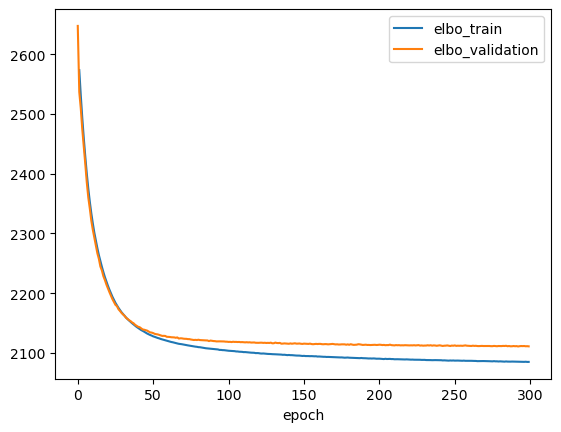

In [39]:
train_elbo = vae.history['elbo_train'][1:]
test_elbo = vae.history['elbo_validation']

ax = train_elbo.plot()
test_elbo.plot(ax = ax);

In [40]:
vae.save('./models/scvi_2023-08-10_model_visium', overwrite = True, save_anndata=True)

In [2]:
vae = scvi.model.SCVI.load('./models/scvi_2023-08-10_model_visium')

INFO     File ./models/scvi_2022-12-15_model/model.pt already downloaded                     


In [41]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
#sc.pp.neighbors(adata, use_rep="X_scVI")

In [44]:
adata.obsm["X_mde"] = scvi.model.utils.mde(adata.obsm["X_scVI"])

In [45]:
sc.pp.neighbors(
            adata,
            use_rep="X_scVI",
            #n_pcs=adata.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )

In [48]:
sc.tl.umap(adata, neighbors_key='neighbors_scvi')

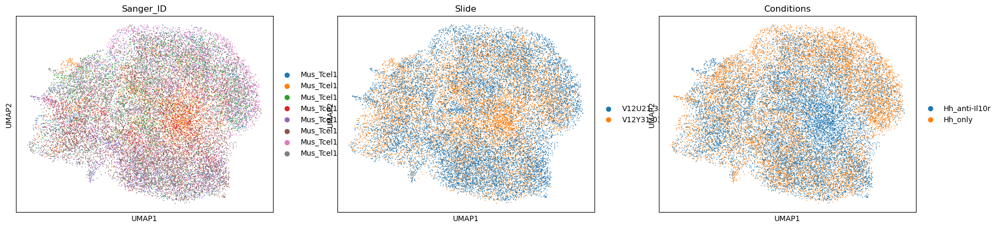

In [50]:
sc.pl.umap(adata, color=['Sanger_ID','Slide', 'Conditions'])

In [51]:
adata.write('mouseST_all_tissueDect_QCed_mergedC2Louts_SYMBOL_afterSCVI.h5ad')

### Open SCVI corrected object

In [24]:
#adata=sc.read('/nfs/team205/rb29/mice_gutTCRtg_project/Src/Mice-gut.TCRtg/new_analysis/Visium/h5ad_files/mouseST_all_tissueDect_QCed_mergedC2Louts_SYMBOL_afterSCVI.h5ad')

In [33]:
adata.uns['Slide_colors']=['#d62728','#279e68']

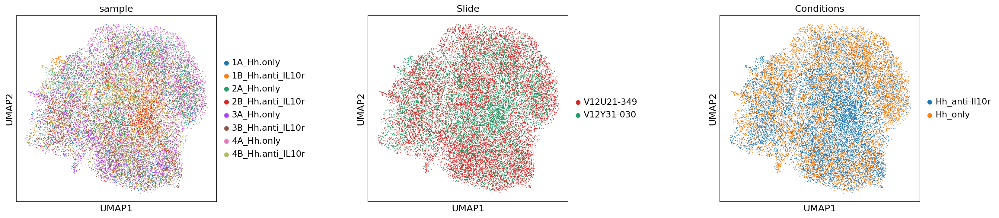

In [35]:
with mpl.rc_context({'font.size': 8, 'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color=['sample','Slide', 'Conditions'],wspace=0.6, save="spatial_data_afterQC-SCVI.pdf")

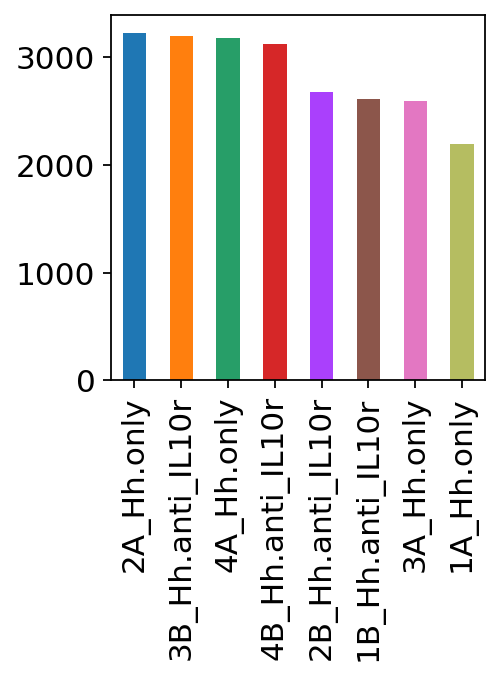

In [28]:
with mpl.rc_context({'font.size': 8, 'figure.figsize': (5, 5)}):
    adata.obs['sample'].value_counts().plot(kind='bar',
        color=['#1f77b4','#ff7f0e','#279e68','#d62728','#aa40fc','#8c564b','#e377c2','#b5bd61'],figsize=(3,3),width=0.5, grid=False)
    plt.savefig("Spots_after_tissueDetect_andQC.pdf")
    plt.show()

---